# Time Series Graphics

## Time Plots

In [1]:
library(fpp3)

── Attaching packages ──────────────────────────────────────────── fpp3 0.4.0 ──

✔ tibble      3.1.6     ✔ tsibble     1.1.1
✔ dplyr       1.0.7     ✔ tsibbledata 0.4.0
✔ tidyr       1.1.4     ✔ feasts      0.2.2
✔ lubridate   1.8.0     ✔ fable       0.3.1
✔ ggplot2     3.3.5     

── Conflicts ───────────────────────────────────────────────── fpp3_conflicts ──
✖ lubridate::date()    masks base::date()
✖ dplyr::filter()      masks stats::filter()
✖ tsibble::intersect() masks base::intersect()
✖ tsibble::interval()  masks lubridate::interval()
✖ dplyr::lag()         masks stats::lag()
✖ tsibble::setdiff()   masks base::setdiff()
✖ tsibble::union()     masks base::union()



In [2]:
options(repr.plot.width=12, repr.plot.height=6)

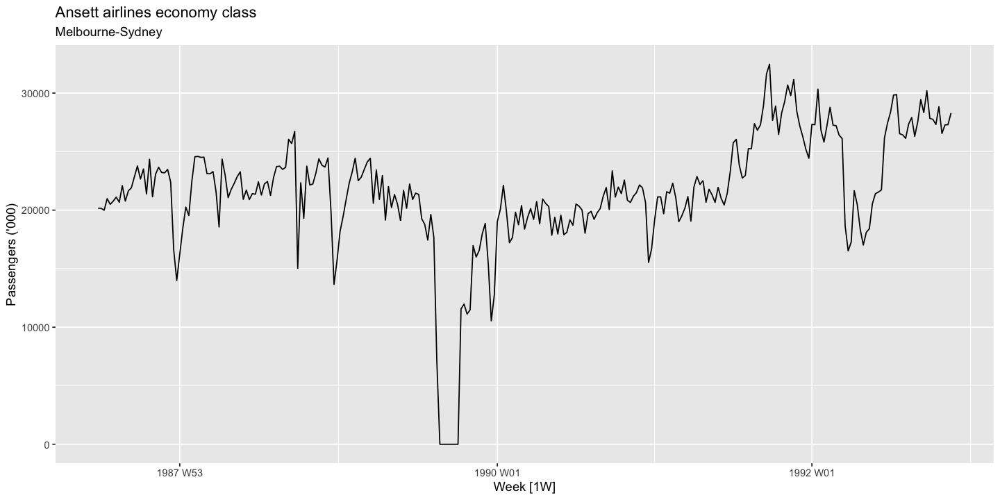

In [3]:
melsyd_economy <- ansett %>%
  filter(Airports=="MEL-SYD", Class=="Economy") %>%
  mutate(Passengers==Passengers/1000)
autoplot(melsyd_economy, Passengers) + 
  labs(title="Ansett airlines economy class", subtitle="Melbourne-Sydney", y="Passengers ('000)")

In [4]:
PBS %>%
  filter(ATC2 == "A10") %>%
  select(Month, Concession, Type, Cost) %>%
  summarise(TotalC = sum(Cost)) %>%
  mutate(Cost = TotalC / 1e6) -> a10

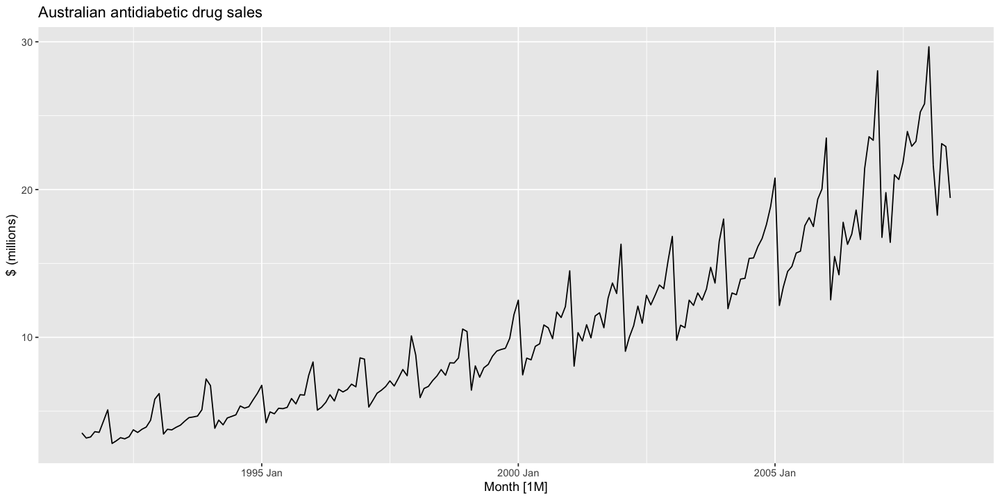

In [5]:
autoplot(a10, Cost) + 
  labs(y="$ (millions)",
       title="Australian antidiabetic drug sales")

## Seasonal Plots

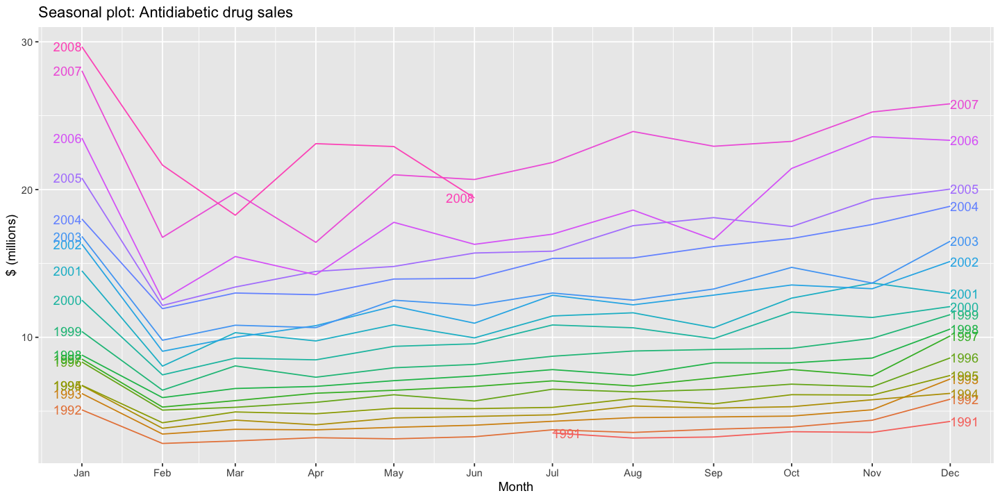

In [6]:
a10 %>%
  gg_season(Cost, labels="both") +
  labs(y="$ (millions)",
       title="Seasonal plot: Antidiabetic drug sales")

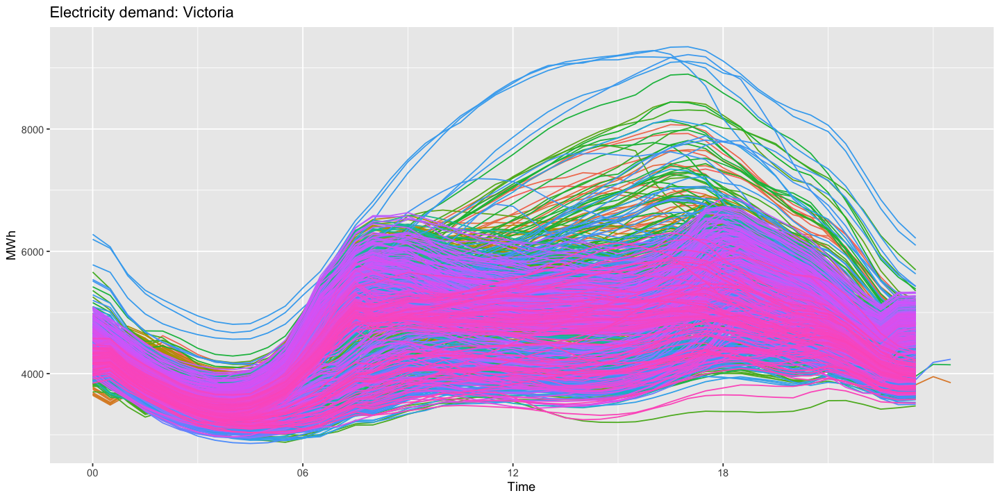

In [7]:
vic_elec %>% gg_season(Demand, period="day") + 
  theme(legend.position="none") + 
  labs(y="MWh", title="Electricity demand: Victoria")

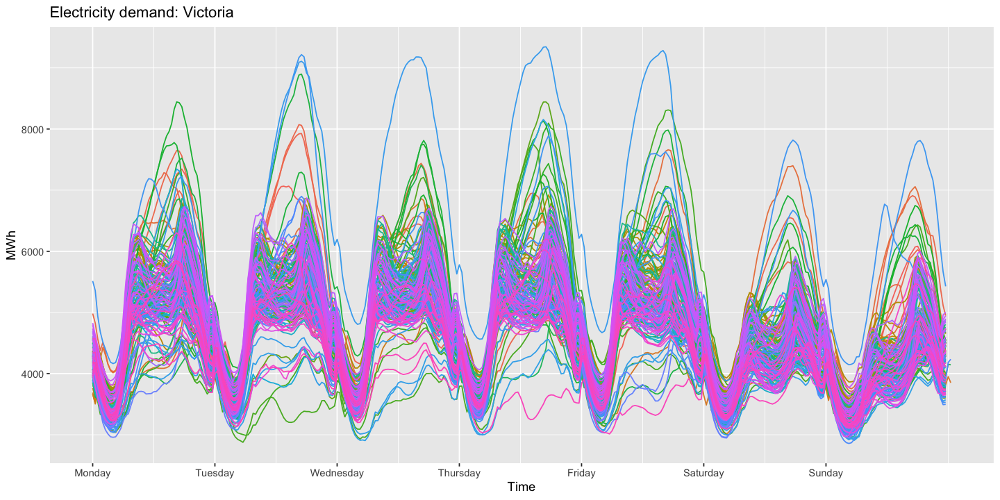

In [8]:
vic_elec %>% gg_season(Demand, period="week") +
  theme(legend.position="none") + 
  labs(y="MWh", title="Electricity demand: Victoria")

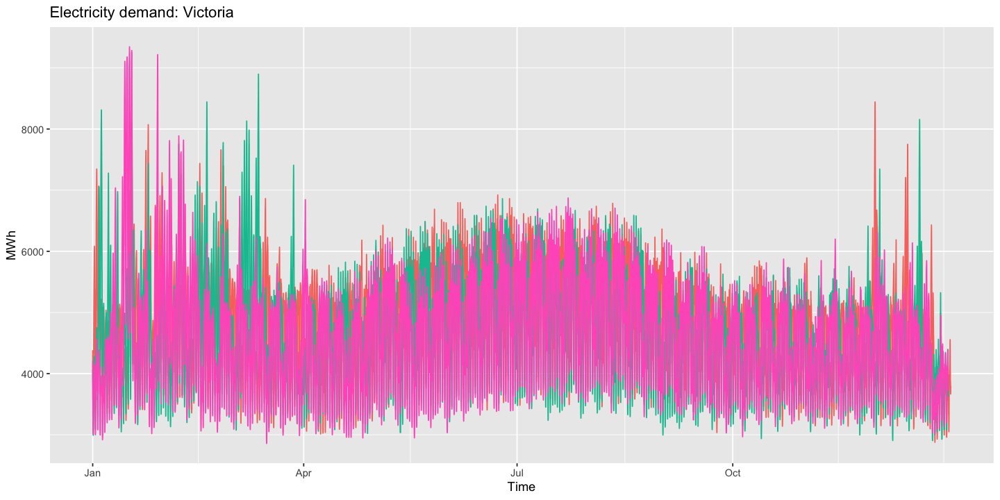

In [9]:
vic_elec %>% gg_season(Demand, period="year") +
  theme(legend.position="none") + 
  labs(y="MWh", title="Electricity demand: Victoria")

## Seasonal Subseries Plots

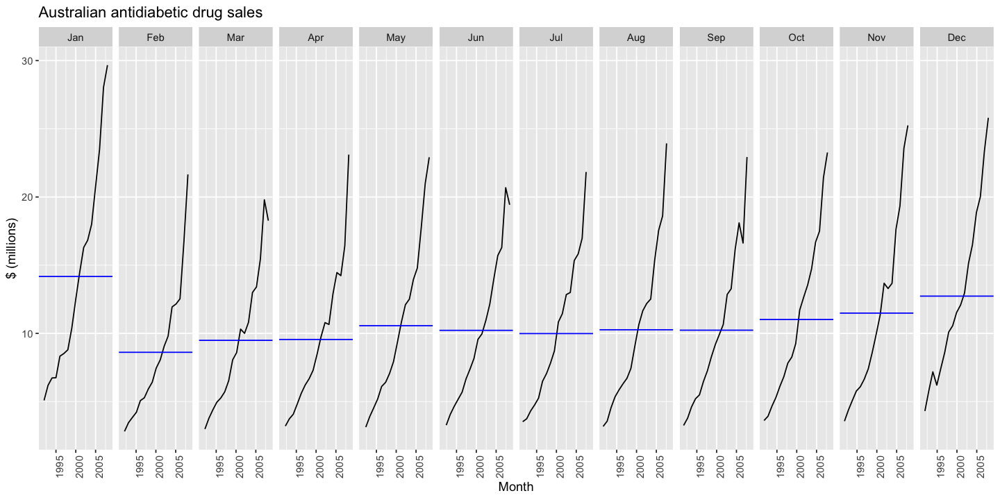

In [10]:
a10 %>%
  gg_subseries(Cost) +
  labs(
    y="$ (millions)",
    title="Australian antidiabetic drug sales")

In [11]:
holidays <- tourism %>%
  filter(Purpose=="Holiday") %>%
  group_by(State) %>%
  summarise(Trips=sum(Trips))

In [12]:
holidays

State,Quarter,Trips
<chr>,<qtr>,<dbl>
ACT,1998 Q1,196.2186
ACT,1998 Q2,126.7706
ACT,1998 Q3,110.6796
ACT,1998 Q4,170.4722
ACT,1999 Q1,107.7792
ACT,1999 Q2,124.6442
ACT,1999 Q3,177.9469
ACT,1999 Q4,217.6562
ACT,2000 Q1,158.4146


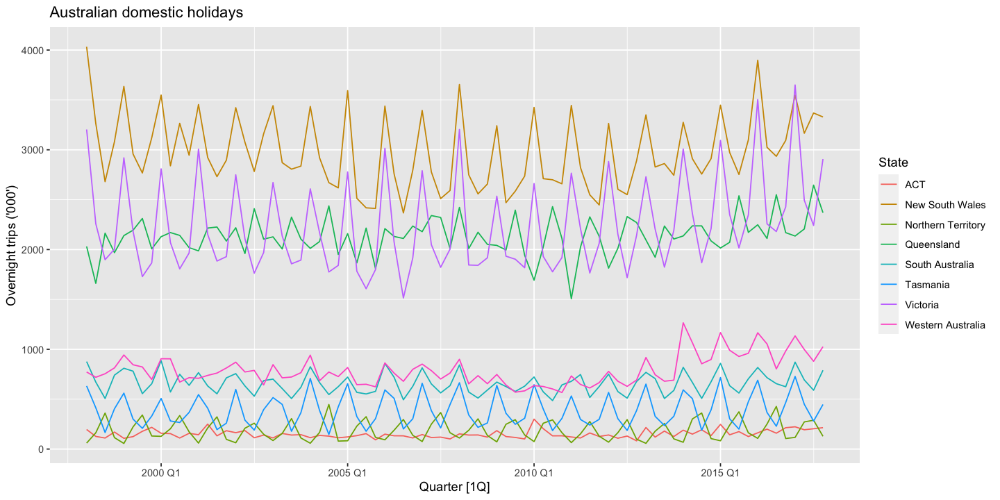

In [13]:
autoplot(holidays, Trips) + 
  labs(y="Overnight trips ('000')",
       title="Australian domestic holidays")

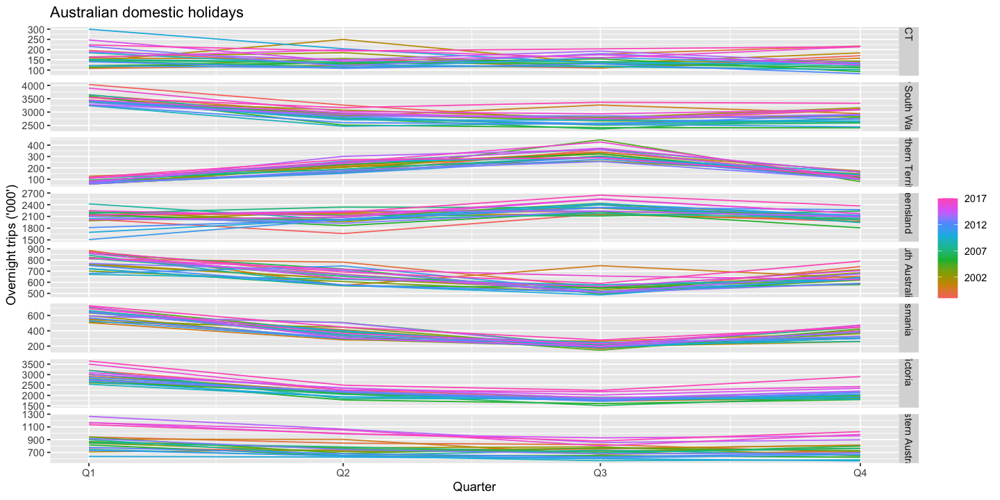

In [14]:
gg_season(holidays, Trips) + 
  labs(y="Overnight trips ('000')",
       title="Australian domestic holidays")

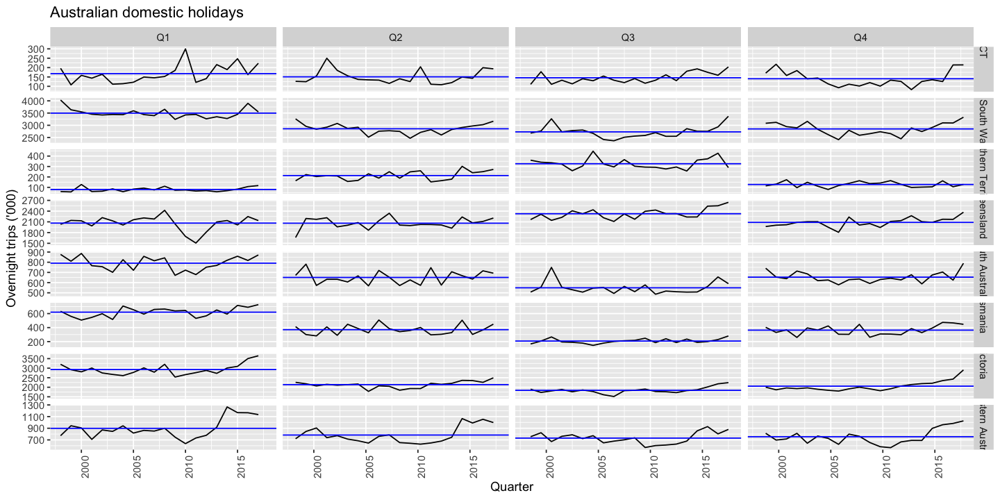

In [15]:
holidays %>%
  gg_subseries(Trips) +
  labs(y="Overnight trips ('000)",
       title="Australian domestic holidays")

## Scatterplots

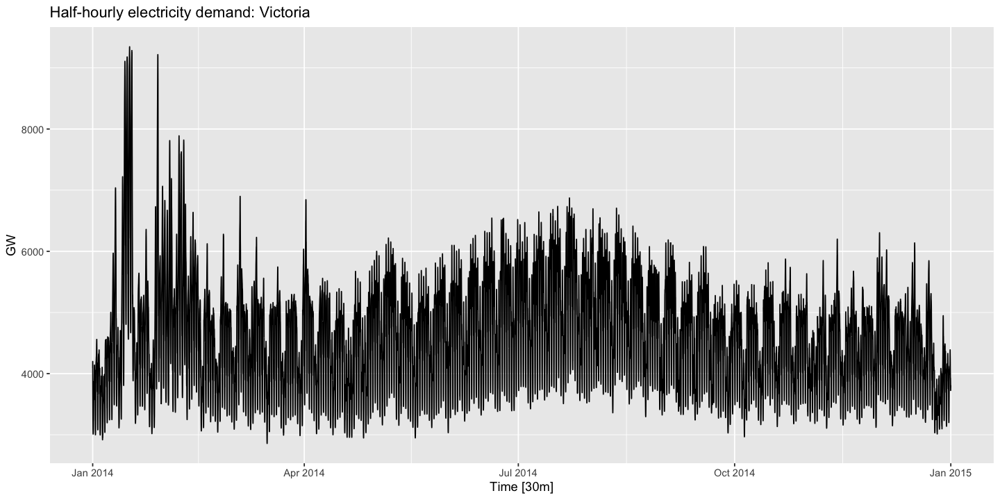

In [16]:
vic_elec %>%
  filter(year(Time)==2014) %>%
  autoplot(Demand) +
  labs(y="GW",
       title="Half-hourly electricity demand: Victoria")

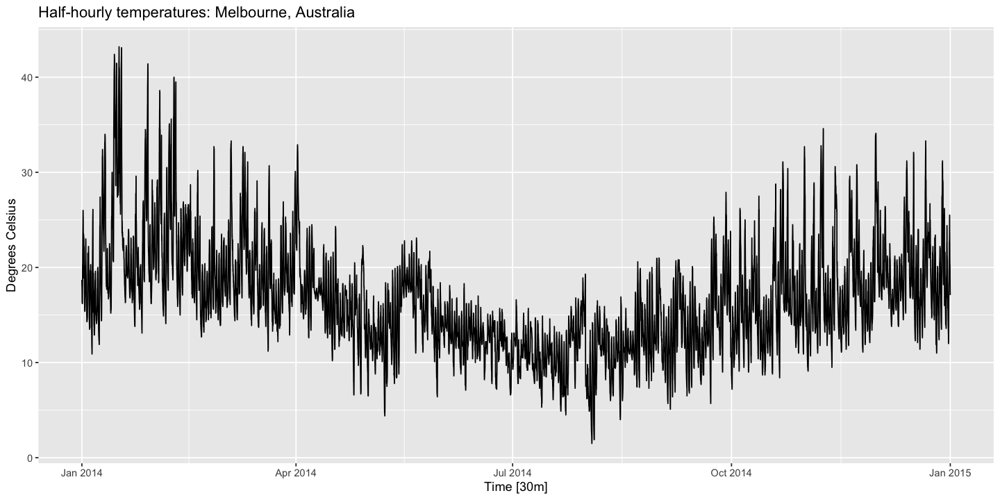

In [17]:
vic_elec %>%
  filter(year(Time)==2014) %>%
  autoplot(Temperature) +
  labs(y="Degrees Celsius",
       title="Half-hourly temperatures: Melbourne, Australia")

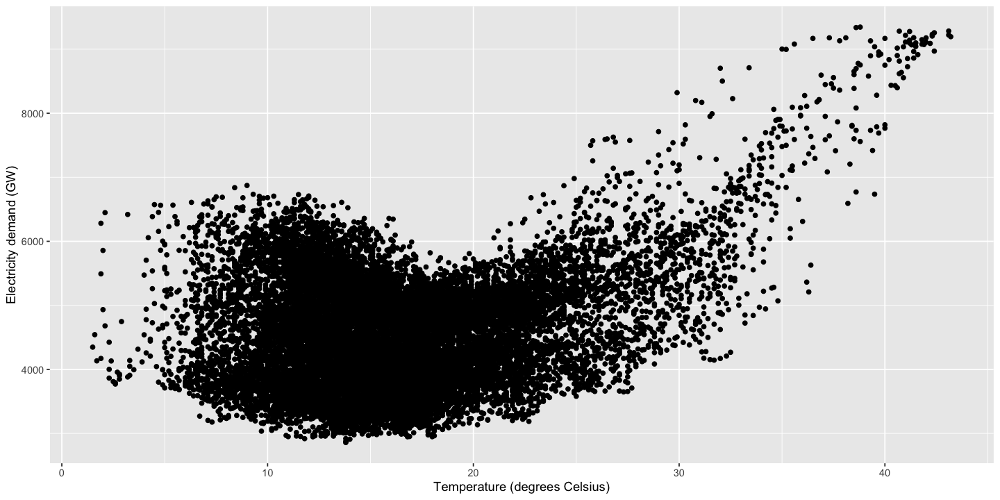

In [18]:
vic_elec %>%
  filter(year(Time)==2014) %>%
  ggplot(aes(x=Temperature, y=Demand)) +
  geom_point() + 
  labs(x="Temperature (degrees Celsius)",
       y="Electricity demand (GW)")

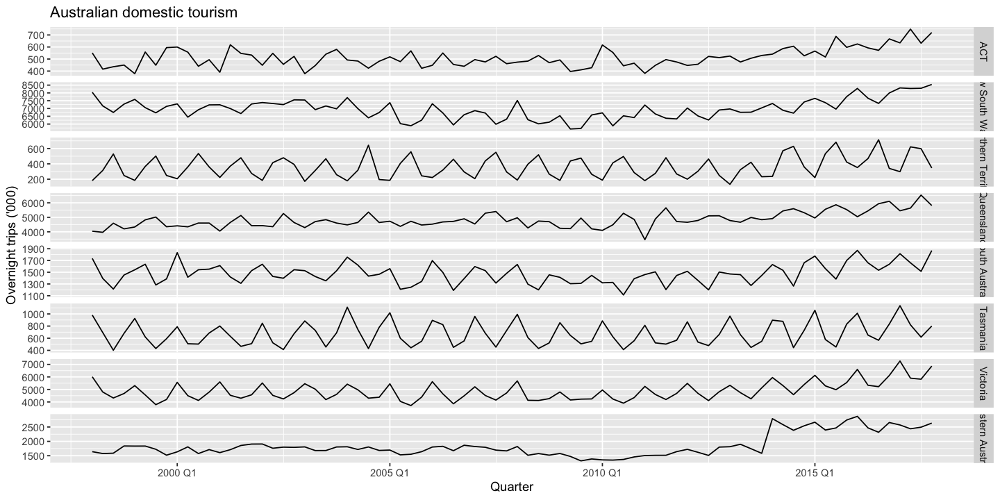

In [19]:
visitors <- tourism %>%
  group_by(State) %>%
  summarise(Trips=sum(Trips))
visitors %>%
  ggplot(aes(x=Quarter, y=Trips)) +
  geom_line() +
  facet_grid(vars(State), scales="free_y") + 
  labs(title="Australian domestic tourism",
       y="Overnight trips ('000)")

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



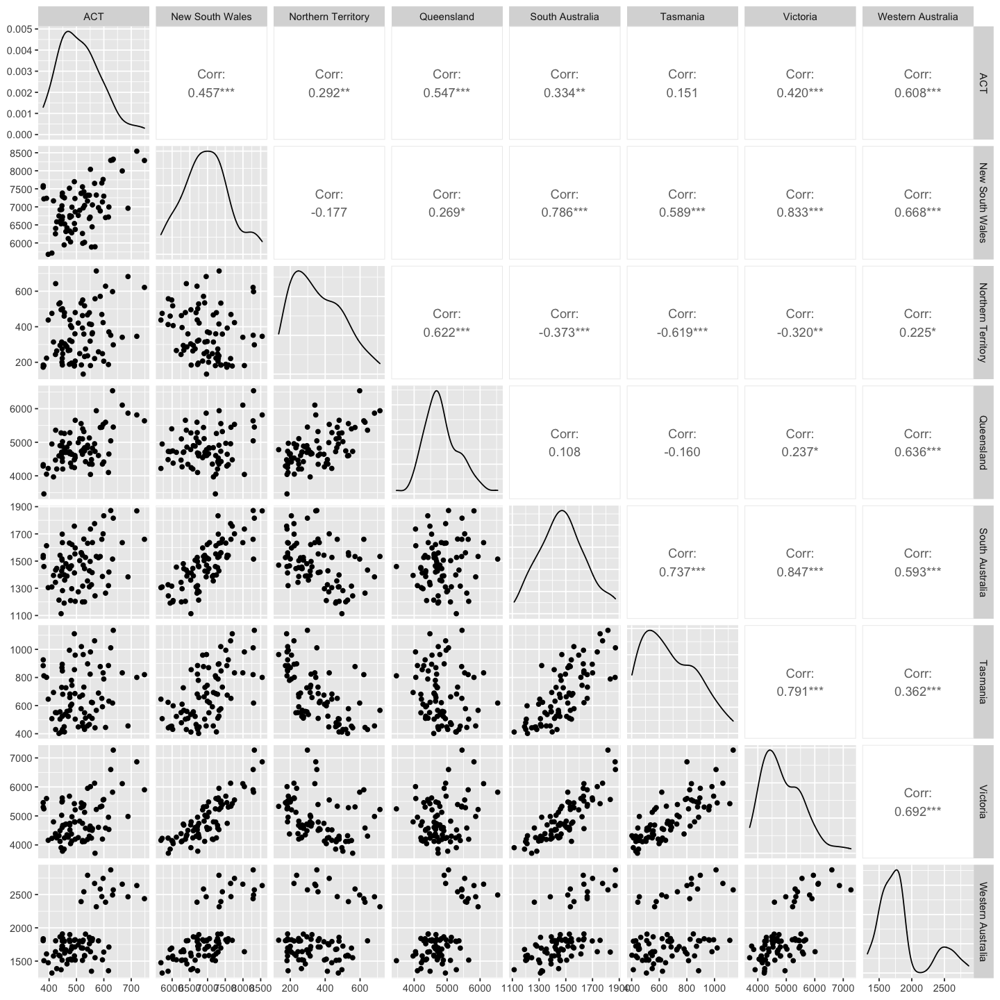

In [20]:
options(repr.plot.width=12, repr.plot.height=12)
visitors %>%
  pivot_wider(values_from=Trips, names_from=State) %>%
  GGally::ggpairs(columns=2:9)

## 2.7 Lag Plots

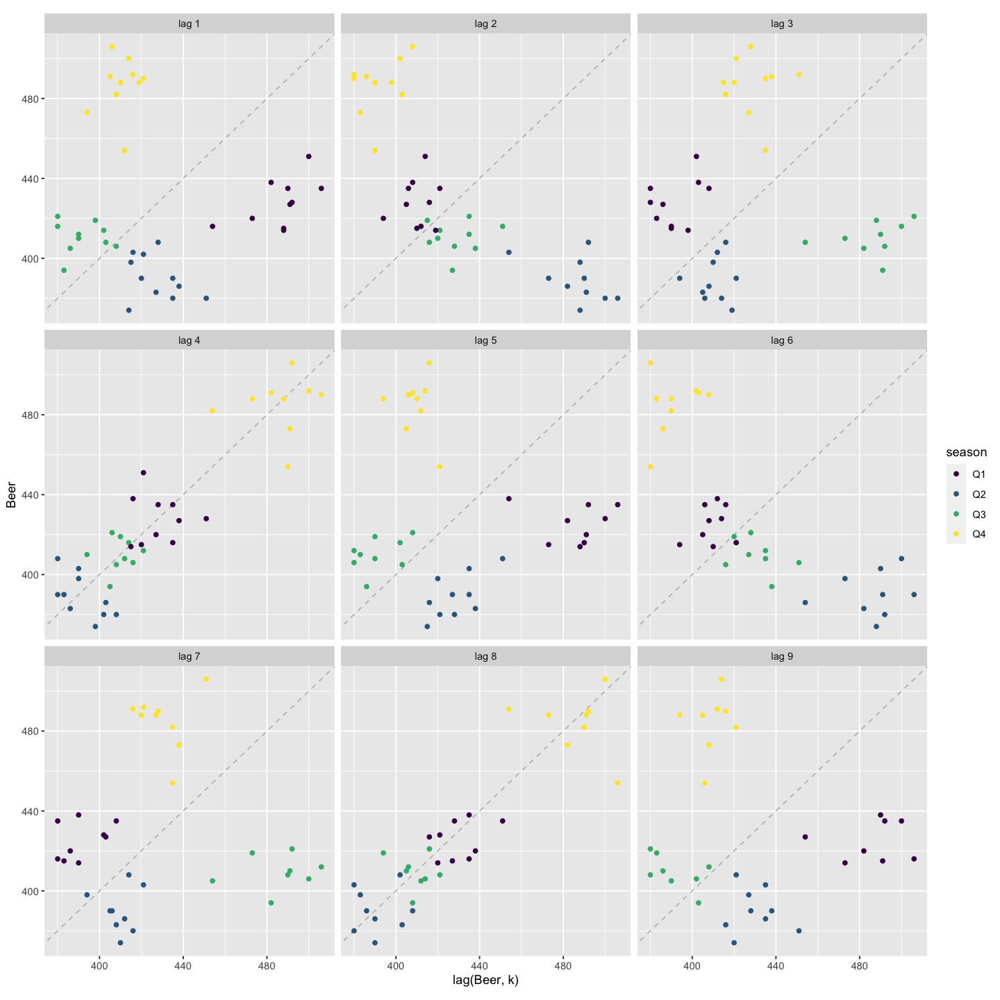

In [21]:
recent_production <- aus_production %>%
  filter(year(Quarter)>=2000)
recent_production %>%
  gg_lag(Beer, geom="point") +
  labs(x="lag(Beer, k)")

## Autocorrelation

In [22]:
recent_production %>% ACF(Beer, lag_max=9)

lag,acf
<lag>,<dbl>
1Q,-0.052981076
2Q,-0.758175440
3Q,-0.026233757
4Q,0.802204530
5Q,-0.077471204
6Q,-0.657451271
7Q,0.001194922
8Q,0.707254078
9Q,-0.088756255


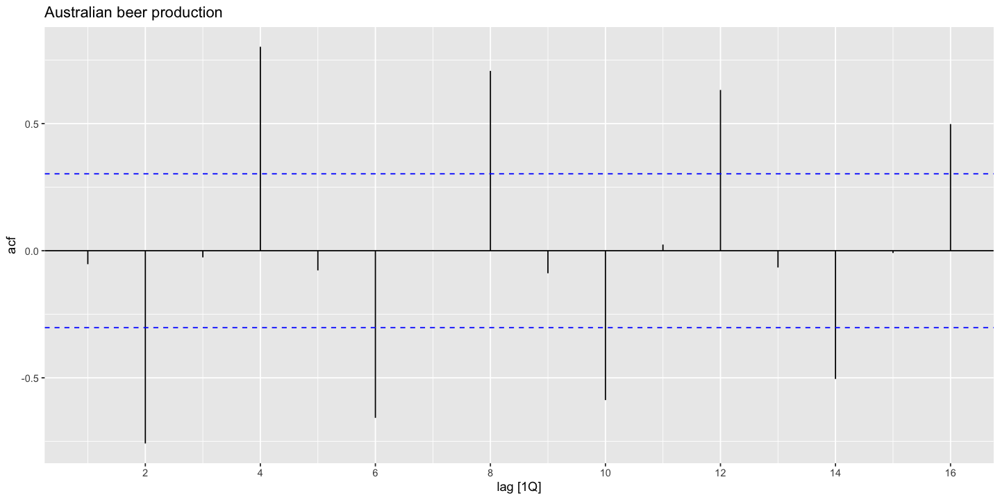

In [23]:
options(repr.plot.width=12, repr.plot.height=6)
recent_production %>%
  ACF(Beer) %>%
  autoplot() + labs(title="Australian beer production")

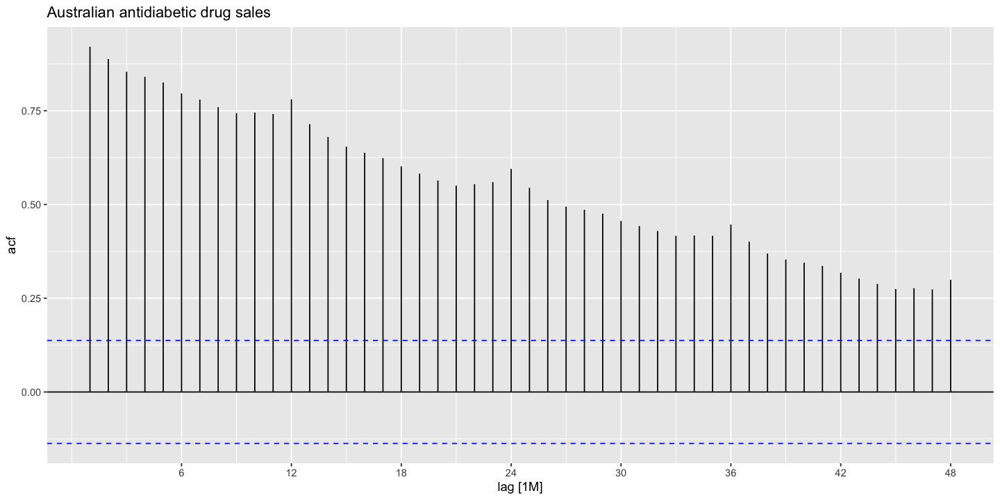

In [24]:
a10 %>%
  ACF(Cost, lag_max=48) %>%
  autoplot() + 
  labs(title="Australian antidiabetic drug sales")  

## White Noise

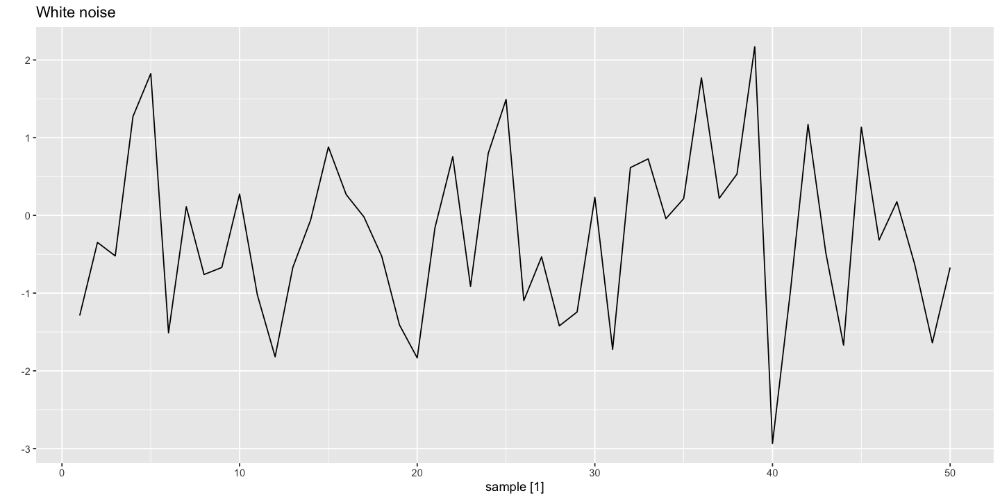

In [25]:
set.seed(30)
y <- tsibble(sample=1:50, wn=rnorm(50), index=sample)
y %>% autoplot(wn) + labs(title="White noise", y="")

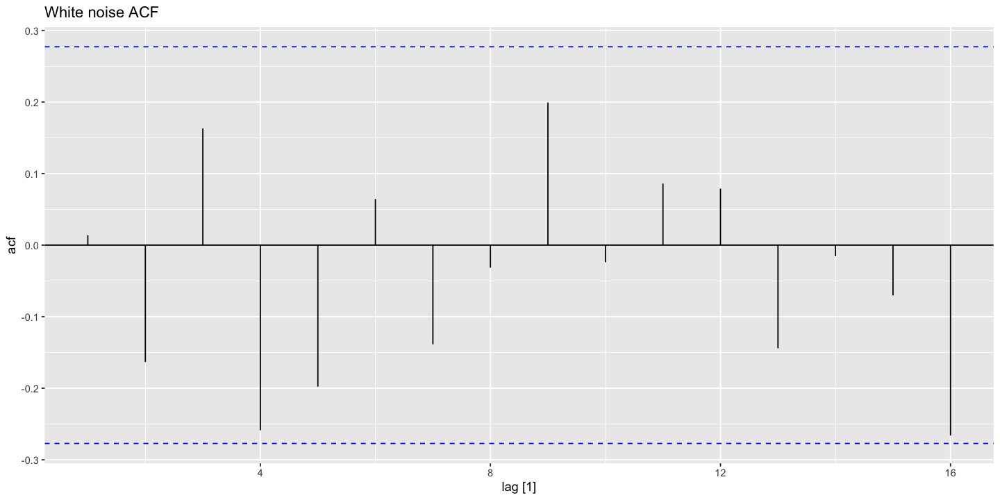

In [26]:
y %>%
  ACF(wn) %>%
  autoplot() + labs(title="White noise ACF")

## Exercises

### 1.

In [27]:
help(gafa_stock)

gafa_stock             package:tsibbledata             R Documentation

_G_A_F_A _s_t_o_c_k _p_r_i_c_e_s

_D_e_s_c_r_i_p_t_i_o_n:

     Historical stock prices from 2014-2018 for Google, Amazon,
     Facebook and Apple. All prices are in $USD.

_F_o_r_m_a_t:

     Time series of class ‘tsibble’

_D_e_t_a_i_l_s:

     ‘gafa_stock’ is a ‘tsibble’ containing data on irregular trading
     days:

       Open:       The opening price for the stock.          
       High:       The stock's highest trading price.        
       Low:        The stock's lowest trading price.         
       Close:      The closing price for the stock.          
       Adj_Close:  The adjusted closing price for the stock. 
       Volume:     The amount of stock traded.               
      
     Each stock is uniquely identified by one key:

       Symbol:  The ticker symbol for the stock. 
      
_S_o_u_r_c_e:

     Yahoo Finance historical data

_E_x_a_m_p_l_e_s:

     library(tsibble)
     gafa_stock

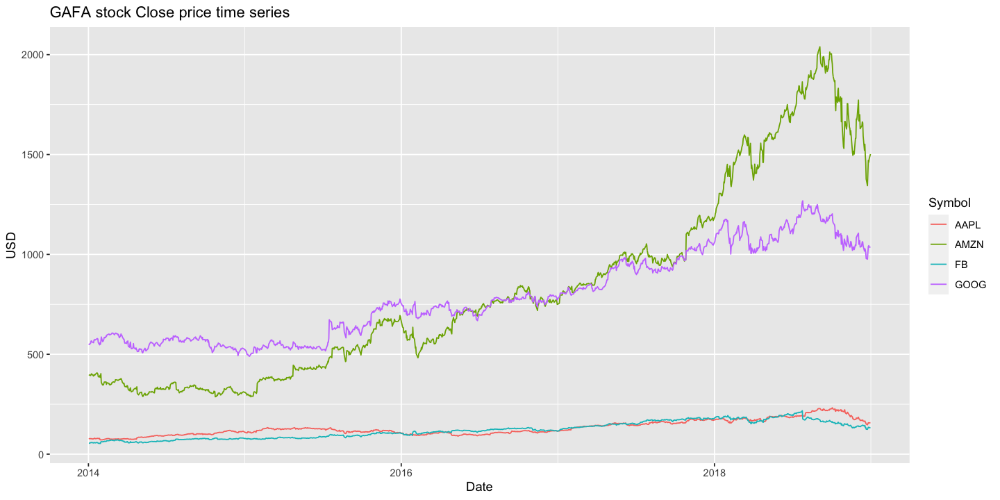

In [28]:
gafa_stock %>%
  autoplot(Close) +
  labs(title="GAFA stock Close price time series", y="USD", x="Date")

In [29]:
help(PBS)

PBS                package:tsibbledata                 R Documentation

_M_o_n_t_h_l_y _M_e_d_i_c_a_r_e _A_u_s_t_r_a_l_i_a _p_r_e_s_c_r_i_p_t_i_o_n _d_a_t_a

_D_e_s_c_r_i_p_t_i_o_n:

     ‘PBS’ is a monthly ‘tsibble’ with two values:

       Scripts:  Total number of scripts     
       Cost:     Cost of the scripts in $AUD 
      
_F_o_r_m_a_t:

     Time series of class ‘tsibble’

_D_e_t_a_i_l_s:

     The data is disaggregated using four keys:

       Concession:  Concessional scripts are given to pensioners, unemployed, dependents, and other card holders                                                                                                         
       Type:        Co-payments are made until an individual's script expenditure hits a threshold ($290.00 for concession, $1141.80 otherwise). Safety net subsidies are provided to individuals exceeding this amount. 
       ATC1:        Anatomical Therapeutic Chemical index (level 1)                                                                                                                                                      
       ATC2:        Anatomical Therapeutic Chemical index (level 2)                                                                                                                                                      
      
_S_o_u_r_c_e:

     Medicare Australia

_E_x_a_m_p_l_e_s:

     library(tsibble)
     PBS

In [30]:
help(vic_elec)

vic_elec              package:tsibbledata              R Documentation

_H_a_l_f-_h_o_u_r_l_y _e_l_e_c_t_r_i_c_i_t_y _d_e_m_a_n_d _f_o_r _V_i_c_t_o_r_i_a, _A_u_s_t_r_a_l_i_a

_D_e_s_c_r_i_p_t_i_o_n:

     ‘vic_elec’ is a half-hourly ‘tsibble’ with three values:

       Demand:       Total electricity demand in MW.                
       Temperature:  Temperature of Melbourne (BOM site 086071).    
       Holiday:      Indicator for if that day is a public holiday. 
      
_F_o_r_m_a_t:

     Time series of class ‘tsibble’.

_D_e_t_a_i_l_s:

     This data is for operational demand, which is the demand met by
     local scheduled generating units, semi-scheduled generating units,
     and non-scheduled intermittent generating units of aggregate
     capacity larger than 30 MW, and by generation imports to the
     region. The operational demand excludes the demand met by
     non-scheduled non-intermittent generating units, non-scheduled
     intermittent generating units of aggregate capacity smaller than
     30 MW, exempt generation (e.g. rooftop solar, gas tri-generation,
     very small wind farms, etc), and demand of local scheduled loads.
     It also excludes some very large industrial users (such as mines
     or smelters).

_S_o_u_r_c_e:

     Australian Energy Market Operator.

_E_x_a_m_p_l_e_s:

     library(tsibble)
     vic_elec

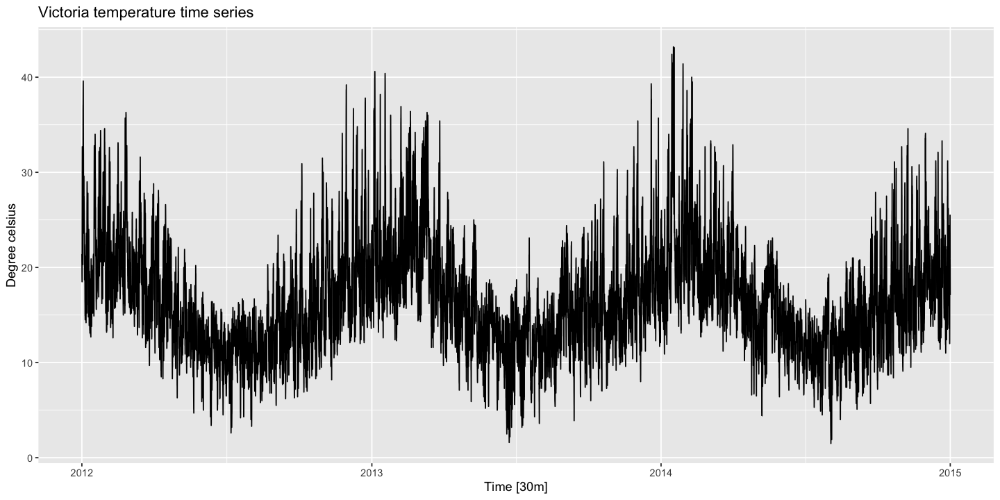

In [31]:
vic_elec %>%
  autoplot(Temperature) +
  labs(title="Victoria temperature time series", y="Degree celsius")

In [32]:
help(pelt)

pelt                package:tsibbledata                R Documentation

_P_e_l_t _t_r_a_d_i_n_g _r_e_c_o_r_d_s

_D_e_s_c_r_i_p_t_i_o_n:

     Hudson Bay Company trading records for Snowshoe Hare and Canadian
     Lynx furs from 1845 to 1935. This data contains trade records for
     all areas of the company.

_F_o_r_m_a_t:

     Time series of class ‘tsibble’

_D_e_t_a_i_l_s:

     ‘pelt’ is an annual ‘tsibble’ with two values:

       Hare:  The number of Snowshoe Hare pelts traded. 
       Lynx:  The number of Canadian Lynx pelts traded. 
      
_S_o_u_r_c_e:

     Hudson Bay Company

_E_x_a_m_p_l_e_s:

     library(tsibble)
     pelt

### 2.

In [33]:
gafa_stock %>%
  filter(Symbol=="GOOG") %>%
    filter(Close==max(Close))

Symbol,Date,Open,High,Low,Close,Adj_Close,Volume
<chr>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GOOG,2018-07-26,1251,1269.771,1249.02,1268.33,1268.33,2405600


In [34]:
gafa_stock %>%
  filter(Symbol=="AMZN") %>%
    filter(Close==max(Close))

Symbol,Date,Open,High,Low,Close,Adj_Close,Volume
<chr>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AMZN,2018-09-04,2026.5,2050.5,2013,2039.51,2039.51,5721100


In [35]:
gafa_stock %>%
  filter(Symbol=="FB") %>%
    filter(Close==max(Close))

Symbol,Date,Open,High,Low,Close,Adj_Close,Volume
<chr>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
FB,2018-07-25,215.72,218.62,214.27,217.5,217.5,58954200


In [36]:
gafa_stock %>%
  filter(Symbol=="AAPL") %>%
    filter(Close==max(Close))

Symbol,Date,Open,High,Low,Close,Adj_Close,Volume
<chr>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAPL,2018-10-03,230.05,233.47,229.78,232.07,230.2755,28654800


### 3.

In [37]:
# Read advertising and sales data
tute1 <- readr::read_csv("data/tute1.csv")
View(tute1)

Rows: 100 Columns: 4

── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl  (3): Sales, AdBudget, GDP
date (1): Quarter


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



Quarter,Sales,AdBudget,GDP
<date>,<dbl>,<dbl>,<dbl>
1981-03-01,1020.2,659.2,251.8
1981-06-01,889.2,589.0,290.9
1981-09-01,795.0,512.5,290.8
1981-12-01,1003.9,614.1,292.4
1982-03-01,1057.7,647.2,279.1
1982-06-01,944.4,602.0,254.0
1982-09-01,778.5,530.7,295.6
1982-12-01,932.5,608.4,271.7
1983-03-01,996.5,637.9,259.6


In [38]:
# Convert the data to time series
mytimeseries <- tute1 %>%
  mutate(Quarter=yearmonth(Quarter)) %>%
  as_tsibble(index=Quarter)

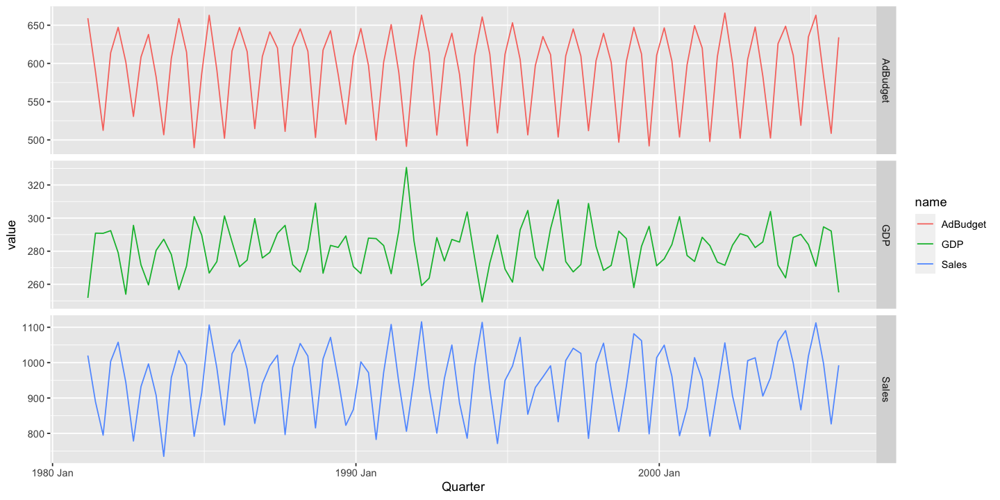

In [39]:
# Construct time series plot of each of the series in the data set
mytimeseries %>%
  pivot_longer(-Quarter) %>%
  ggplot(aes(x=Quarter, y=value, colour=name)) +
  geom_line() +
  facet_grid(name ~ ., scales="free_y")

### 4.

In [40]:
library(USgas)

In [41]:
usgas_timeseries <- us_total %>%
  as_tsibble(index=year, key=state)

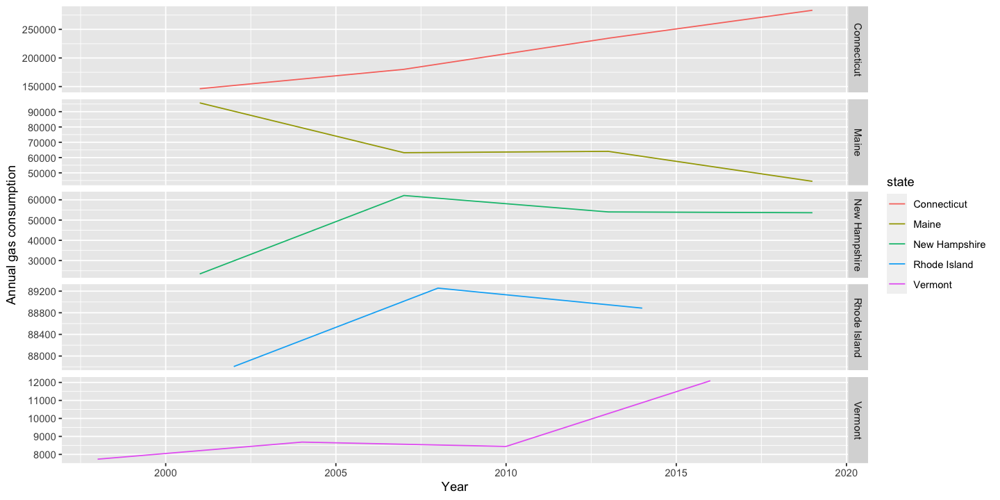

In [42]:
usgas_timeseries %>%
  filter(
      state==c("Maine", "Vermont", "New Hampshire", "Massachussetts", "Connecticut", "Rhode Island")
  ) %>%
  ggplot(aes(x=year, y=y, colour=state)) + 
  geom_line() +
  facet_grid(state ~ ., scales="free_y") +
  labs(y="Annual gas consumption", x="Year")

### 5.

In [43]:
tourismxl <- readxl::read_excel("data/tourism.xlsx")

In [44]:
tourismts <- tourismxl %>%
  mutate(Quarter=yearquarter(Quarter)) %>%
  as_tsibble(index=Quarter, key=c(Region, Purpose, State))

In [45]:
tourismts %>%
  select(Region, Purpose, Trips) %>%
  group_by(Region, Purpose) %>%
  summarise(avg_trips=mean(Trips)) 

Region,Purpose,Quarter,avg_trips
<chr>,<chr>,<qtr>,<dbl>
Adelaide,Business,1998 Q1,135.07769
Adelaide,Business,1998 Q2,109.98732
Adelaide,Business,1998 Q3,166.03469
Adelaide,Business,1998 Q4,127.16046
Adelaide,Business,1999 Q1,137.44853
Adelaide,Business,1999 Q2,199.91259
Adelaide,Business,1999 Q3,169.35509
Adelaide,Business,1999 Q4,134.35794
Adelaide,Business,2000 Q1,154.03440


### 6. 

Warning message:
“Removed 20 row(s) containing missing values (geom_path).”


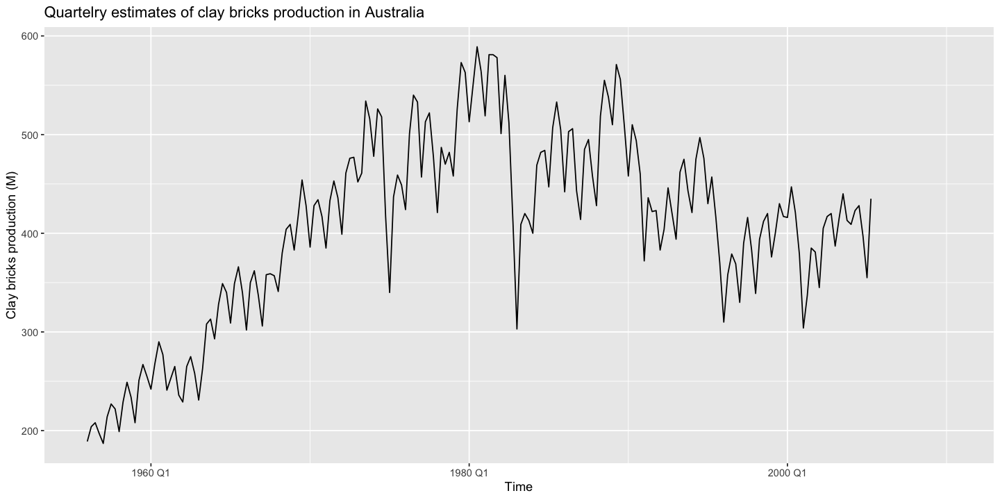

aus_production           package:tsibbledata           R Documentation

_Q_u_a_r_t_e_r_l_y _p_r_o_d_u_c_t_i_o_n _o_f _s_e_l_e_c_t_e_d _c_o_m_m_o_d_i_t_i_e_s _i_n _A_u_s_t_r_a_l_i_a.

_D_e_s_c_r_i_p_t_i_o_n:

     Quarterly estimates of selected indicators of manufacturing
     production in Australia.

_F_o_r_m_a_t:

     Time series of class ‘tsibble’.

_D_e_t_a_i_l_s:

     ‘aus_production’ is a half-hourly ‘tsibble’ with six values:

       Beer:         Beer production in megalitres.                     
       Tobacco:      Tobacco and cigarette production in tonnes.        
       Bricks:       Clay brick production in millions of bricks.       
       Cement:       Portland cement production in thousands of tonnes. 
       Electricity:  Electricity production in gigawatt hours.          
       Gas:          Gas production in petajoules.                      
      
_S_o_u_r_c_e:

     Australian Bureau of Statistics, catalogue number 8301.0.55.001
     table 1.

_E_x_a_m_p_l_e_s:

     library(tsibble)
     aus_production

In [73]:
#aus_production
help(aus_production)
bricks <- aus_production %>%
  select(Bricks)
bricks %>%
  autoplot(Bricks) +
  labs(title="Quartelry estimates of clay bricks production in Australia", y="Clay bricks production (M)", x="Time")

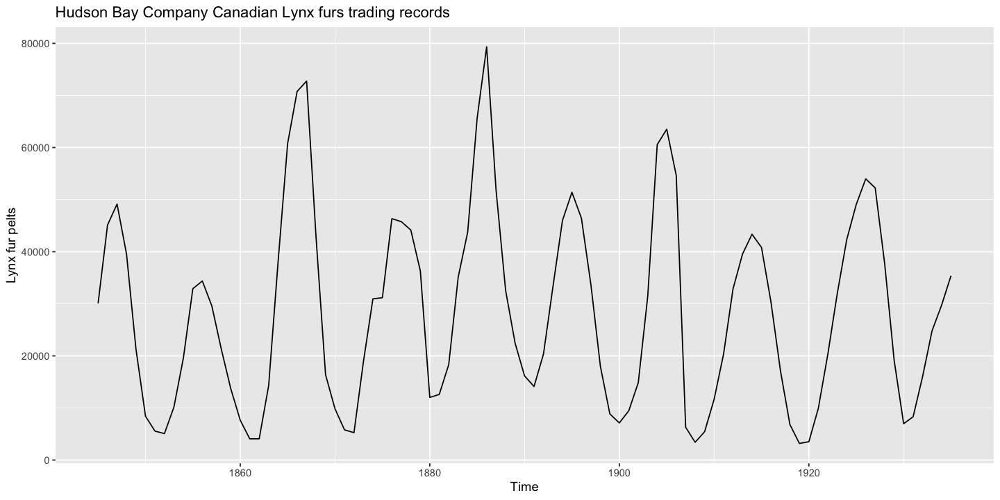

pelt                package:tsibbledata                R Documentation

_P_e_l_t _t_r_a_d_i_n_g _r_e_c_o_r_d_s

_D_e_s_c_r_i_p_t_i_o_n:

     Hudson Bay Company trading records for Snowshoe Hare and Canadian
     Lynx furs from 1845 to 1935. This data contains trade records for
     all areas of the company.

_F_o_r_m_a_t:

     Time series of class ‘tsibble’

_D_e_t_a_i_l_s:

     ‘pelt’ is an annual ‘tsibble’ with two values:

       Hare:  The number of Snowshoe Hare pelts traded. 
       Lynx:  The number of Canadian Lynx pelts traded. 
      
_S_o_u_r_c_e:

     Hudson Bay Company

_E_x_a_m_p_l_e_s:

     library(tsibble)
     pelt

In [74]:
#pelt
help(pelt)
lynx <- pelt %>% 
  select(Lynx)
lynx %>%
  autoplot(Lynx) +
  labs(title="Hudson Bay Company Canadian Lynx furs trading records", y="Lynx fur pelts", x="Time")

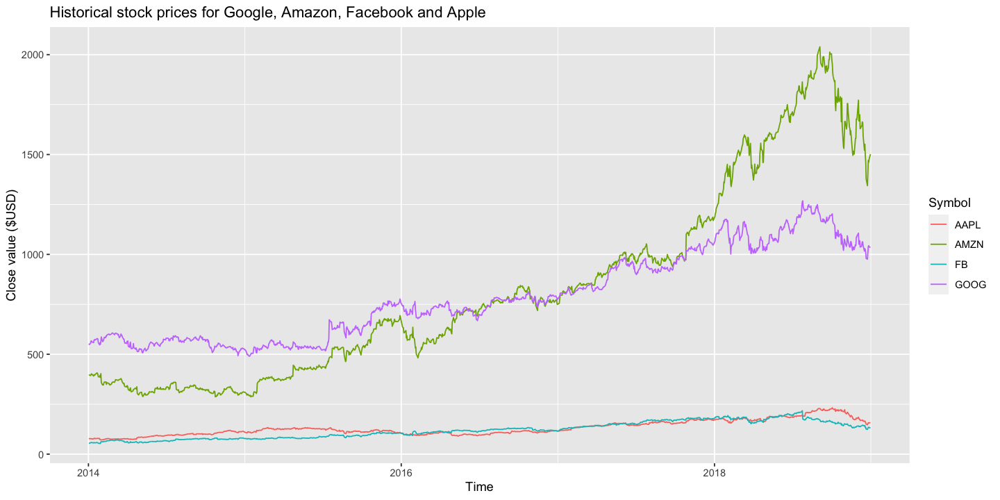

gafa_stock             package:tsibbledata             R Documentation

_G_A_F_A _s_t_o_c_k _p_r_i_c_e_s

_D_e_s_c_r_i_p_t_i_o_n:

     Historical stock prices from 2014-2018 for Google, Amazon,
     Facebook and Apple. All prices are in $USD.

_F_o_r_m_a_t:

     Time series of class ‘tsibble’

_D_e_t_a_i_l_s:

     ‘gafa_stock’ is a ‘tsibble’ containing data on irregular trading
     days:

       Open:       The opening price for the stock.          
       High:       The stock's highest trading price.        
       Low:        The stock's lowest trading price.         
       Close:      The closing price for the stock.          
       Adj_Close:  The adjusted closing price for the stock. 
       Volume:     The amount of stock traded.               
      
     Each stock is uniquely identified by one key:

       Symbol:  The ticker symbol for the stock. 
      
_S_o_u_r_c_e:

     Yahoo Finance historical data

_E_x_a_m_p_l_e_s:

     library(tsibble)
     gafa_stock

In [75]:
#gafa_stock
help(gafa_stock)
close <- gafa_stock %>%
  select(Close)
close %>%
  autoplot(Close) +
  labs(title="Historical stock prices for Google, Amazon, Facebook and Apple", y="Close value ($USD)", x="Time")

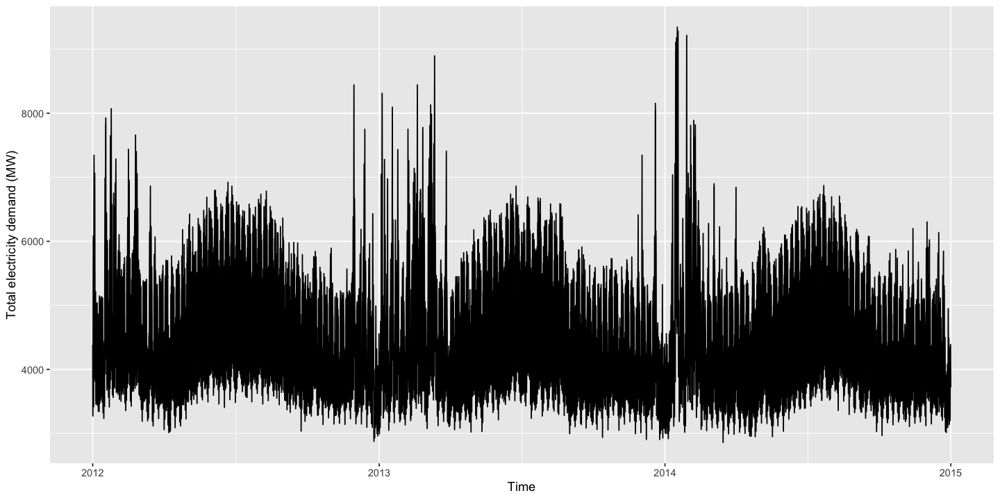

vic_elec              package:tsibbledata              R Documentation

_H_a_l_f-_h_o_u_r_l_y _e_l_e_c_t_r_i_c_i_t_y _d_e_m_a_n_d _f_o_r _V_i_c_t_o_r_i_a, _A_u_s_t_r_a_l_i_a

_D_e_s_c_r_i_p_t_i_o_n:

     ‘vic_elec’ is a half-hourly ‘tsibble’ with three values:

       Demand:       Total electricity demand in MW.                
       Temperature:  Temperature of Melbourne (BOM site 086071).    
       Holiday:      Indicator for if that day is a public holiday. 
      
_F_o_r_m_a_t:

     Time series of class ‘tsibble’.

_D_e_t_a_i_l_s:

     This data is for operational demand, which is the demand met by
     local scheduled generating units, semi-scheduled generating units,
     and non-scheduled intermittent generating units of aggregate
     capacity larger than 30 MW, and by generation imports to the
     region. The operational demand excludes the demand met by
     non-scheduled non-intermittent generating units, non-scheduled
     intermittent generating units of aggregate capacity smaller than
     30 MW, exempt generation (e.g. rooftop solar, gas tri-generation,
     very small wind farms, etc), and demand of local scheduled loads.
     It also excludes some very large industrial users (such as mines
     or smelters).

_S_o_u_r_c_e:

     Australian Energy Market Operator.

_E_x_a_m_p_l_e_s:

     library(tsibble)
     vic_elec

In [68]:
#vic_elec
help(vic_elec)
demand <- vic_elec %>%
  select(Demand)
demand %>%
  autoplot(Demand) +
  labs(Title="Half-hourly electricity demand for Victoria, Australia", x="Time", y="Total electricity demand (MW)")

### 7.

In [69]:
#aus_arrivals
help(aus_arrivals)

aus_arrivals {fpp3},R Documentation


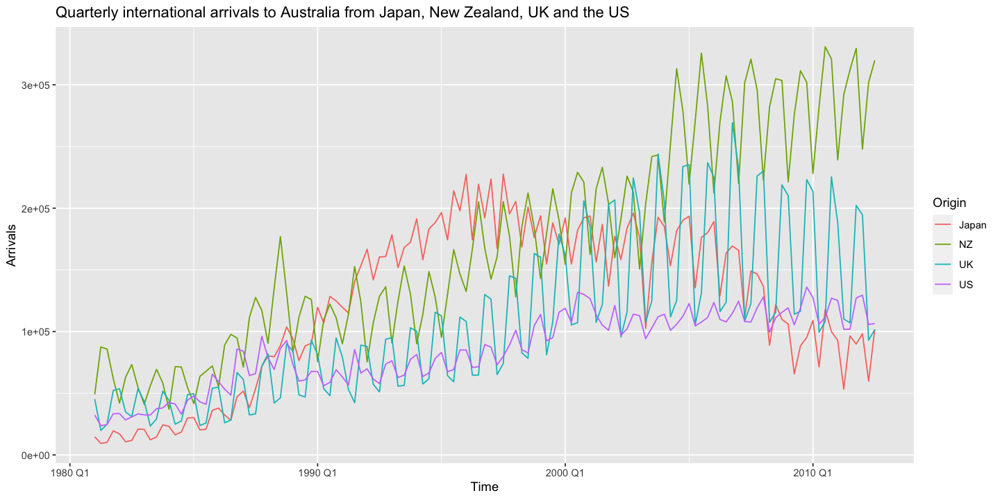

In [72]:
aus_arrivals %>%
  autoplot(Arrivals) +
  labs(title="Quarterly international arrivals to Australia from Japan, New Zealand, UK and the US", x="Time", y="Arrivals")

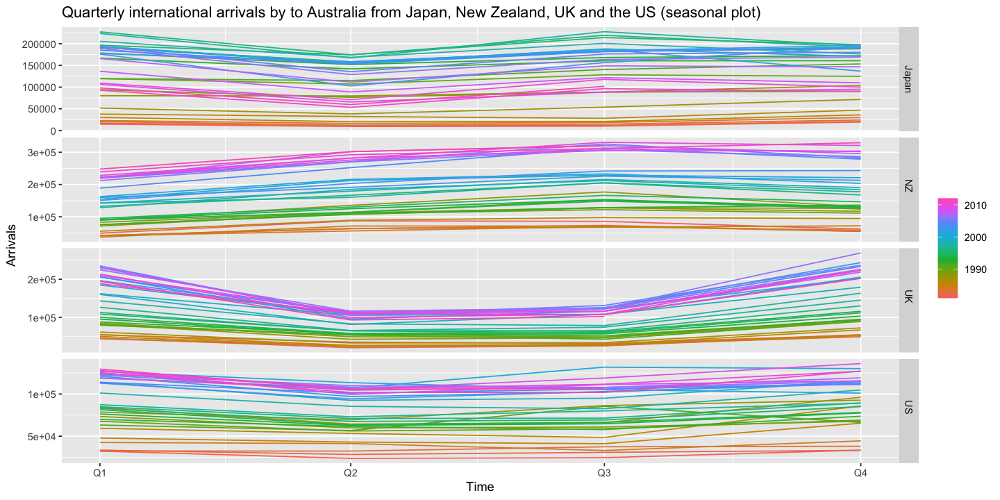

In [83]:
aus_arrivals %>%
  gg_season(Arrivals) +
  labs(title="Quarterly international arrivals by to Australia from Japan, New Zealand, UK and the US (seasonal plot)", x="Time", y="Arrivals")

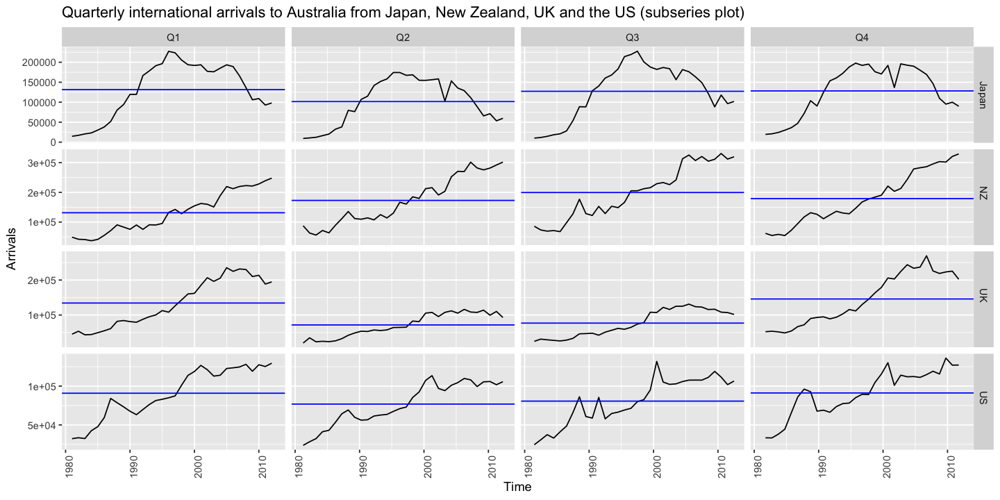

In [84]:
aus_arrivals %>%
  gg_subseries(Arrivals) +
  labs(title="Quarterly international arrivals to Australia from Japan, New Zealand, UK and the US (subseries plot)", x="Time", y="Arrivals")

### 8.

In [86]:
#aus_retail
help(aus_retail)

aus_retail             package:tsibbledata             R Documentation

_A_u_s_t_r_a_l_i_a_n _r_e_t_a_i_l _t_r_a_d_e _t_u_r_n_o_v_e_r

_D_e_s_c_r_i_p_t_i_o_n:

     ‘aus_retail’ is a monthly ‘tsibble’ with one value:

       Turnover:  Retail turnover in $Million AUD 
      
_F_o_r_m_a_t:

     Time series of class ‘tsibble’

_D_e_t_a_i_l_s:

     Each series is uniquely identified using two keys:

       State:     The Australian state (or territory) 
       Industry:  The industry of retail trade        
      
_S_o_u_r_c_e:

     Australian Bureau of Statistics, catalogue number 8501.0, table
     11.

_E_x_a_m_p_l_e_s:

     library(tsibble)
     aus_retail

In [89]:
set.seed(42)
ausretail <- aus_retail %>%
  filter(`Series ID`==sample(aus_retail$`Series ID`, 1))

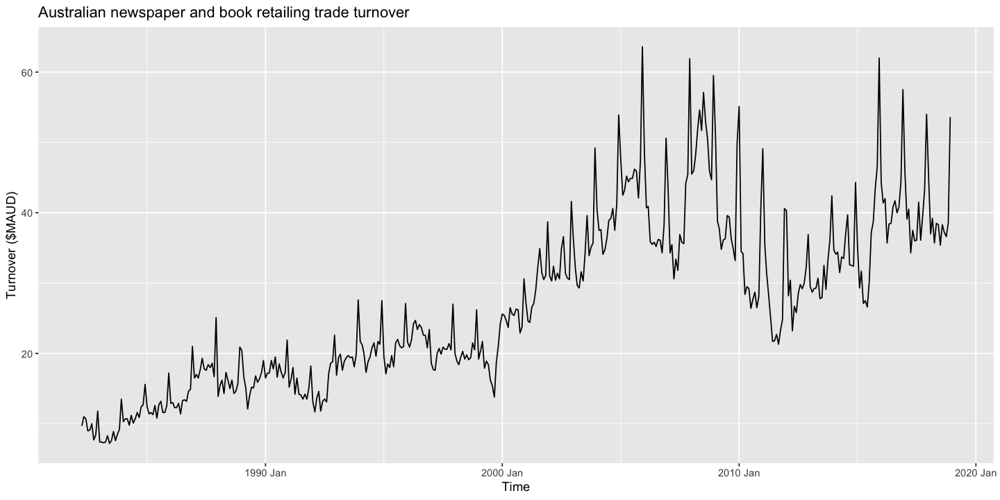

In [94]:
ausretail %>%
  autoplot(Turnover) +
  labs(title="Australian newspaper and book retailing trade turnover", x="Time", y="Turnover ($MAUD)")

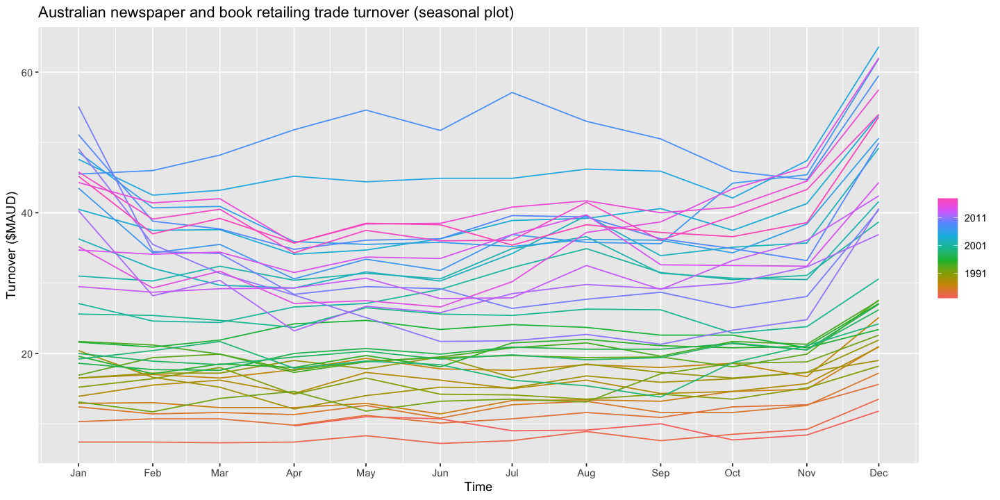

In [97]:
ausretail %>%
  gg_season(Turnover) +
  labs(title="Australian newspaper and book retailing trade turnover (seasonal plot)", x="Time", y="Turnover ($MAUD)")

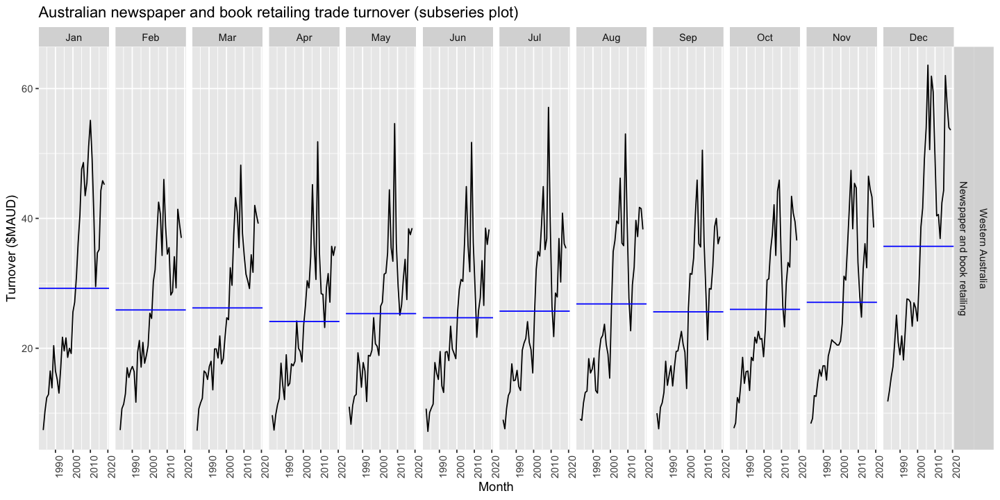

In [100]:
ausretail %>%
  gg_subseries(Turnover) +
  labs(title="Australian newspaper and book retailing trade turnover (subseries plot)", x="Month", y="Turnover ($MAUD)")

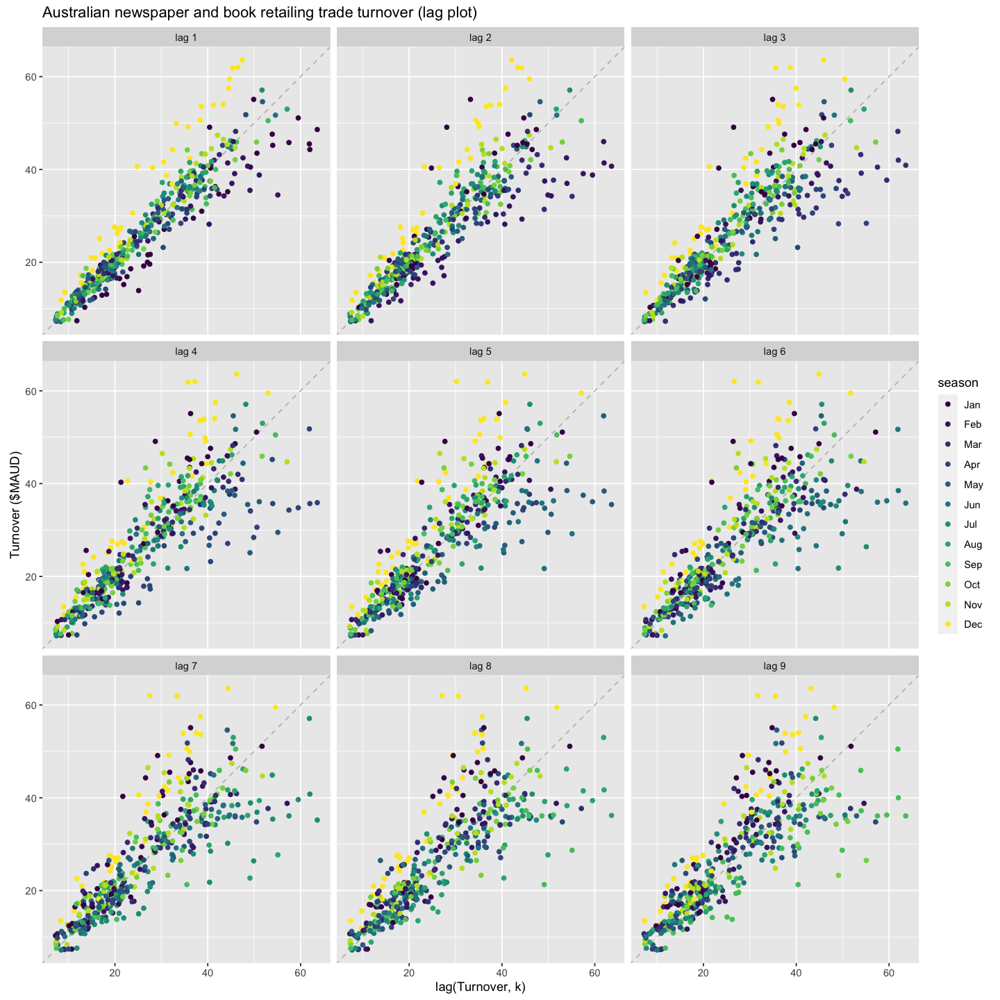

In [111]:
options(repr.plot.width=12, repr.plot.height=12)
ausretail %>%
  gg_lag(Turnover, geom="point") +
  labs(title="Australian newspaper and book retailing trade turnover (lag plot)", x="lag(Turnover, k)", y="Turnover ($MAUD)")

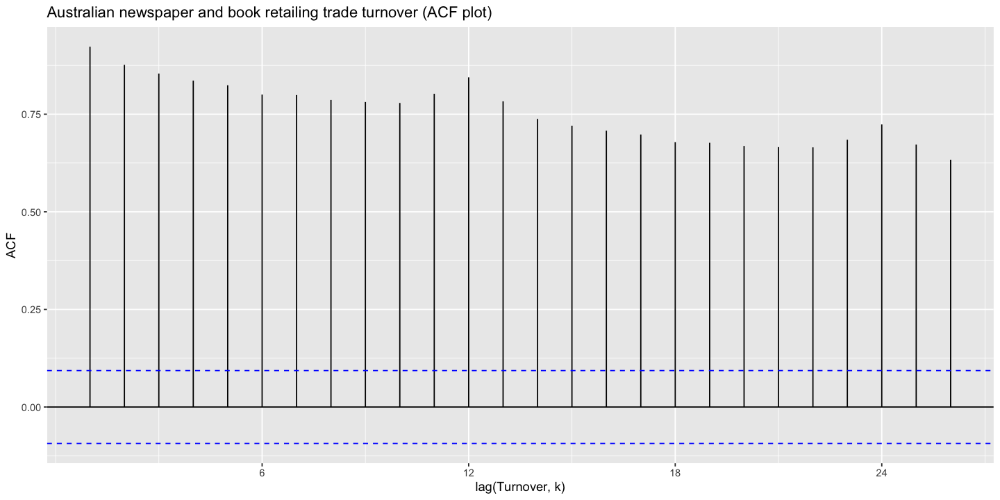

In [115]:
options(repr.plot.width=12, repr.plot.height=6)
ausretail %>%
  ACF(Turnover) %>%
  autoplot() + 
  labs(title="Australian newspaper and book retailing trade turnover (ACF plot)", x="lag(Turnover, k)", y="ACF")

### 9.

In [121]:
#us_employment
help(us_employment)

us_employment {fpp3},R Documentation


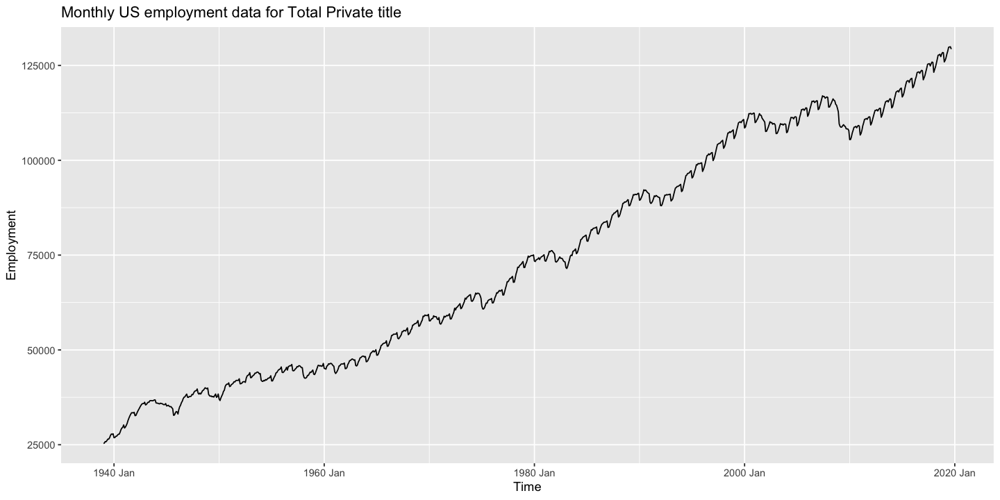

In [122]:
total_private <- us_employment %>%
  filter(`Title`=="Total Private")
total_private %>%
  autoplot(Employed) +
  labs(title="Monthly US employment data for Total Private title", x="Time", y="Employment")

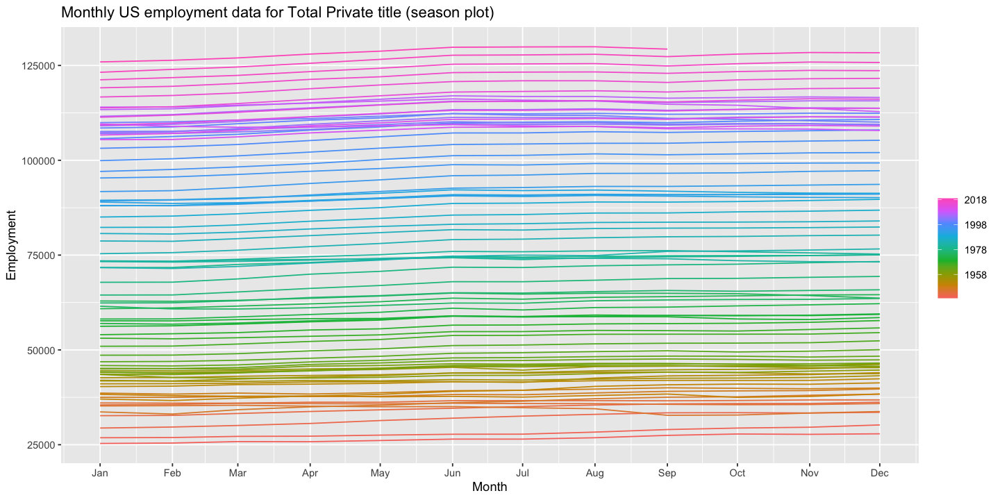

In [125]:
total_private %>%
  gg_season(Employed) +
  labs(title="Monthly US employment data for Total Private title (seasonal plot)", x="Month", y="Employment")

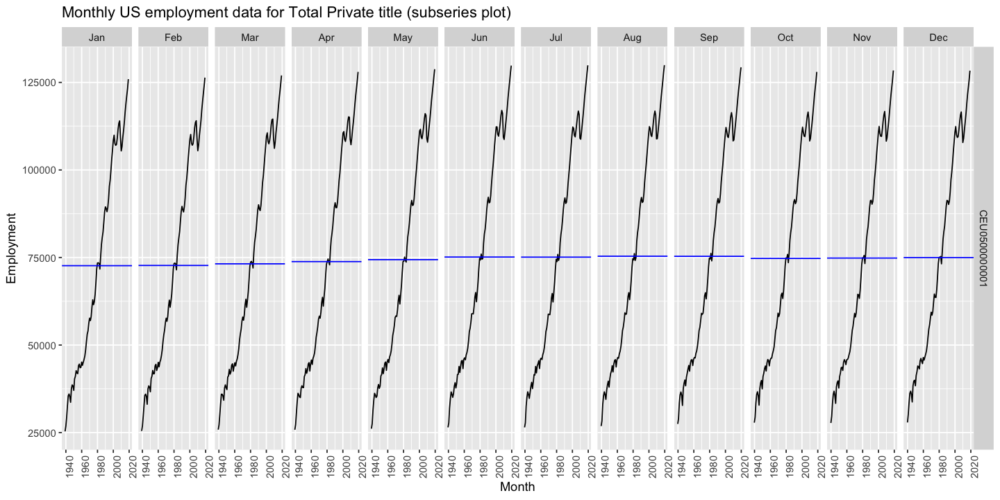

In [126]:
total_private %>%
  gg_subseries(Employed) +
  labs(title="Monthly US employment data for Total Private title (subseries plot)", x="Month", y="Employment")